In [4]:
!git clone https://github.com/albert306/colie-experiments.git

fatal: destination path 'colie-experiments' already exists and is not an empty directory.


## Default behaviour

In [5]:
!cd colie-experiments; python colie.py --input_folder 'input' --alpha 1 --beta 20 --gamma 9 --delta 5 --L 0.5

 > running
100% 5/5 [00:23<00:00,  4.70s/it]
 > reconstruction done


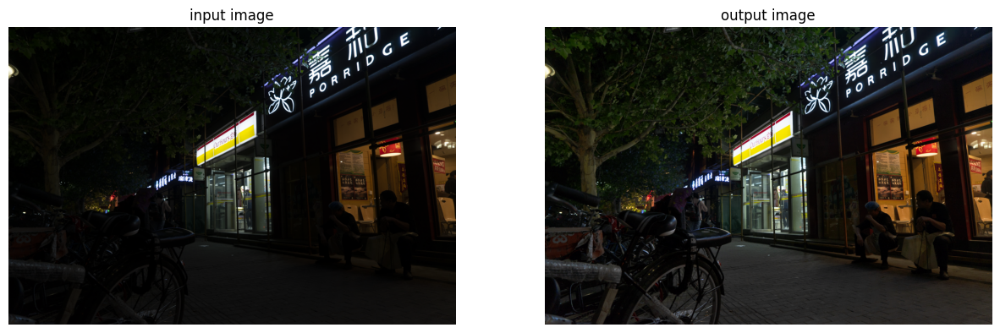

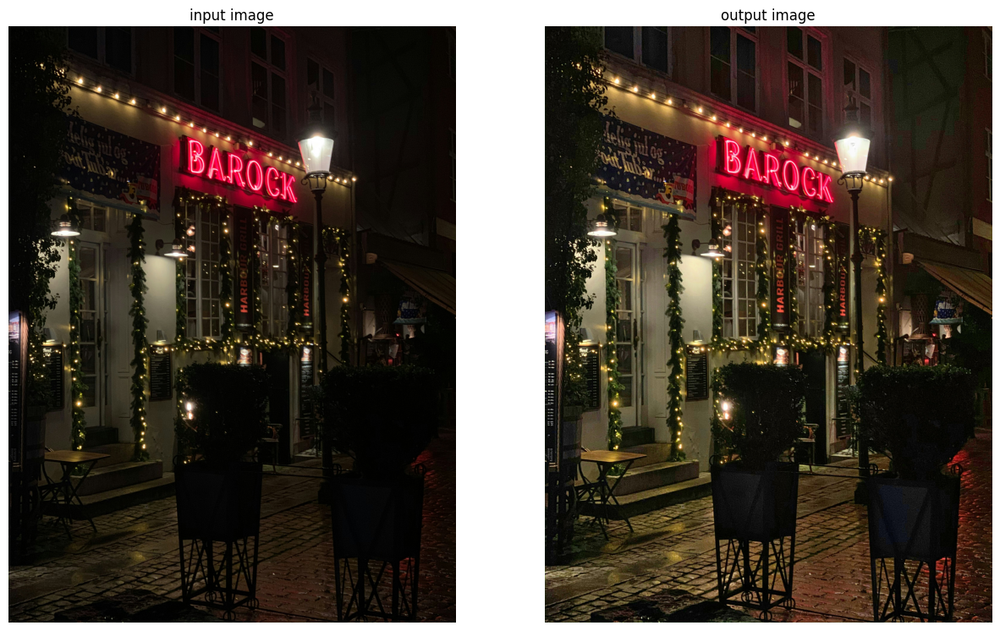

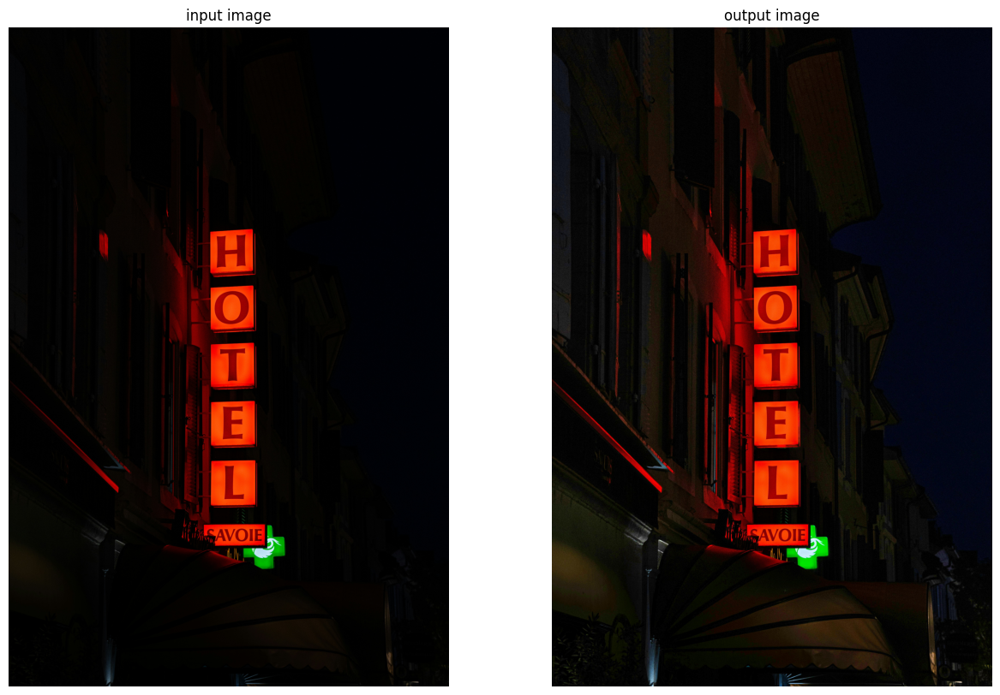

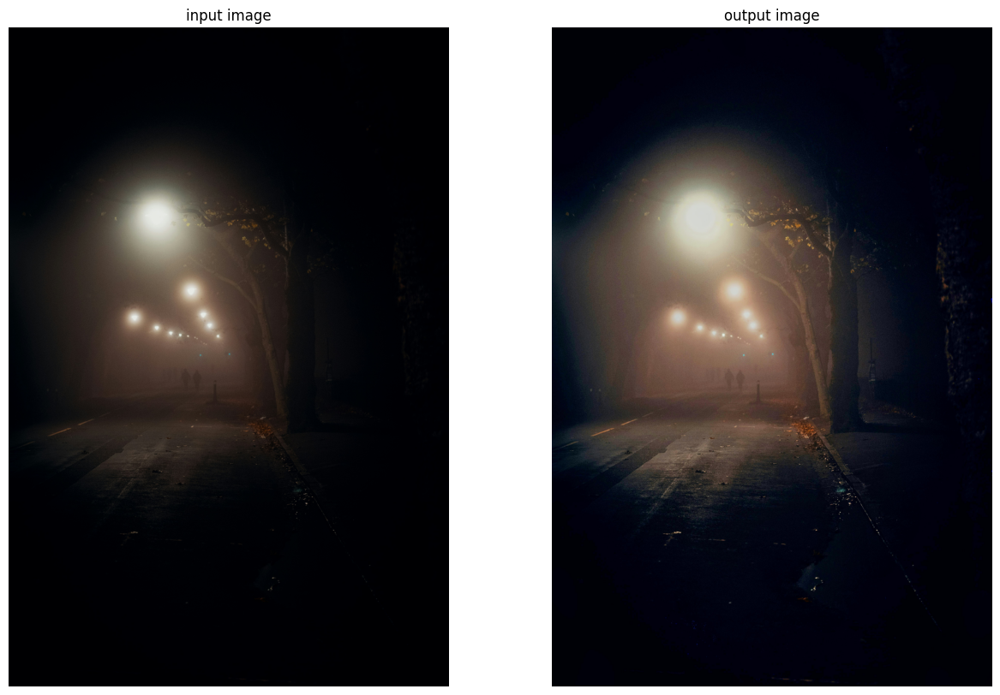

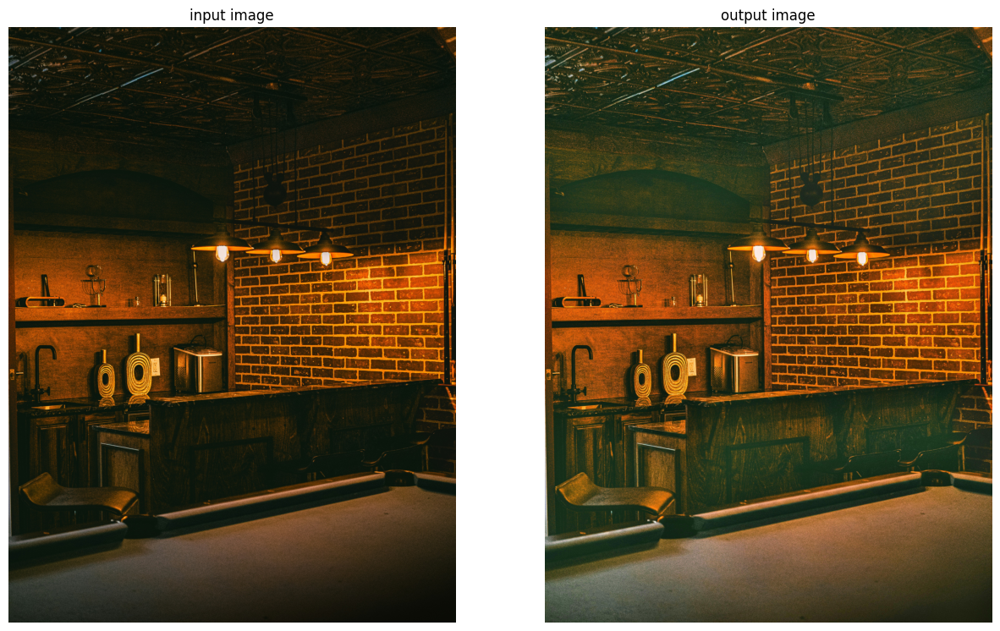

In [6]:
import matplotlib.pyplot as plt
from PIL import Image
import os

for filename in os.listdir('colie-experiments/input/'):
    input_image  = Image.open('colie-experiments/input/' + filename)
    output_image = Image.open('colie-experiments/output/' + filename)

    plt.figure(figsize=(15, 10))
    plt.subplot(121)
    plt.imshow(input_image)
    plt.title('input image')
    plt.axis('off')
    plt.subplot(122)
    plt.imshow(output_image)
    plt.title('output image')
    plt.axis('off')
    plt.show()

## Modification
Adjustable split between patch_net (neighbor V values) and spatial_net (coordinates) with param `--patch_coord_split`. By default set to 0.5. 1 means only patch_net, 0 means only spatial_net.

In [7]:
!cd colie-experiments; python colie.py --input_folder 'input' --output_folder 'output_split_0'  --patch_coord_split 0 --alpha 1 --beta 20 --gamma 9 --delta 5 --L 0.5
!cd colie-experiments; python colie.py --input_folder 'input' --output_folder 'output_split_0.25'  --patch_coord_split 0.25 --alpha 1 --beta 20 --gamma 9 --delta 5 --L 0.5
!cd colie-experiments; python colie.py --input_folder 'input' --output_folder 'output_split_0.75'  --patch_coord_split 0.75 --alpha 1 --beta 20 --gamma 9 --delta 5 --L 0.5
!cd colie-experiments; python colie.py --input_folder 'input' --output_folder 'output_split_1'  --patch_coord_split 1 --alpha 1 --beta 20 --gamma 9 --delta 5 --L 0.5

 > running
  0% 0/5 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/nn/modules/linear.py:124: UserWarning: Initializing zero-element tensors is a no-op
  init.kaiming_uniform_(self.weight, a=math.sqrt(5))
 20% 1/5 [00:06<00:24,  6.19s/it]/usr/local/lib/python3.12/dist-packages/torch/nn/modules/linear.py:124: UserWarning: Initializing zero-element tensors is a no-op
  init.kaiming_uniform_(self.weight, a=math.sqrt(5))
100% 5/5 [00:23<00:00,  4.61s/it]
 > reconstruction done
 > running
100% 5/5 [00:24<00:00,  4.82s/it]
 > reconstruction done
 > running
100% 5/5 [00:24<00:00,  4.85s/it]
 > reconstruction done
 > running
  0% 0/5 [00:00<?, ?it/s]/usr/local/lib/python3.12/dist-packages/torch/nn/modules/linear.py:124: UserWarning: Initializing zero-element tensors is a no-op
  init.kaiming_uniform_(self.weight, a=math.sqrt(5))
 20% 1/5 [00:06<00:24,  6.24s/it]/usr/local/lib/python3.12/dist-packages/torch/nn/modules/linear.py:124: UserWarning: Initializing zero-element tensors i

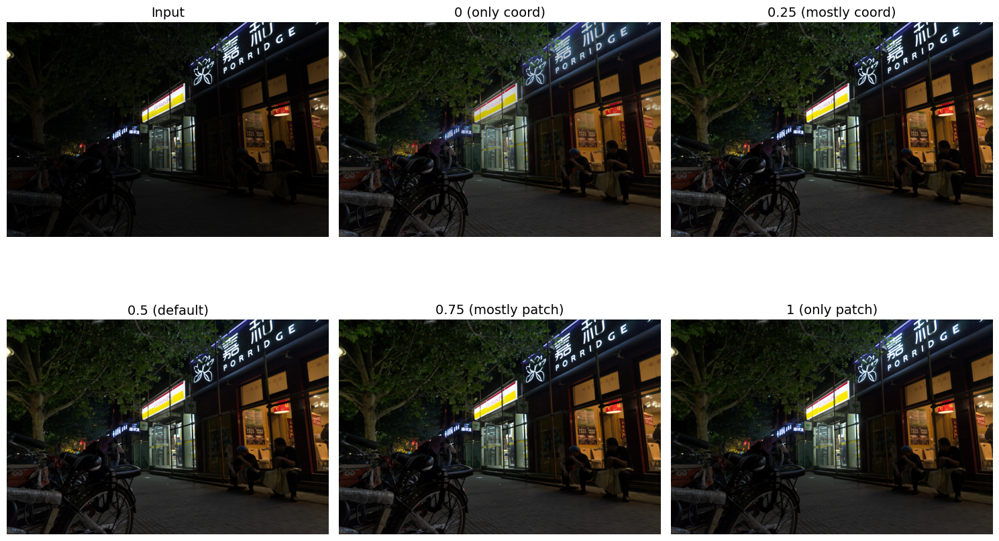

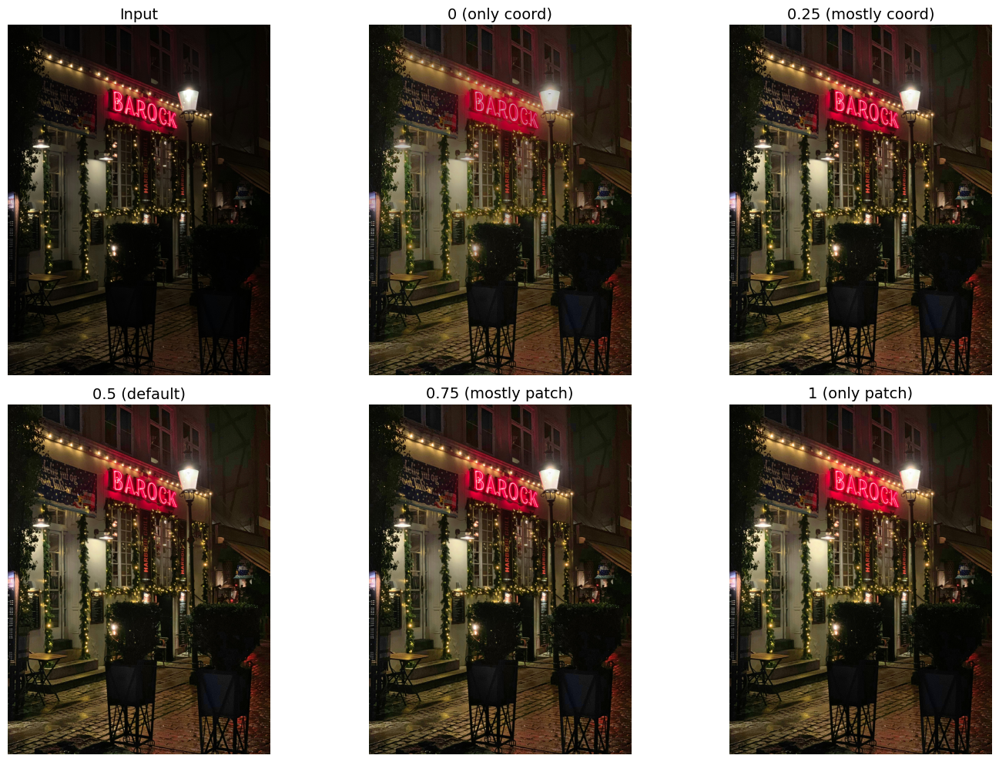

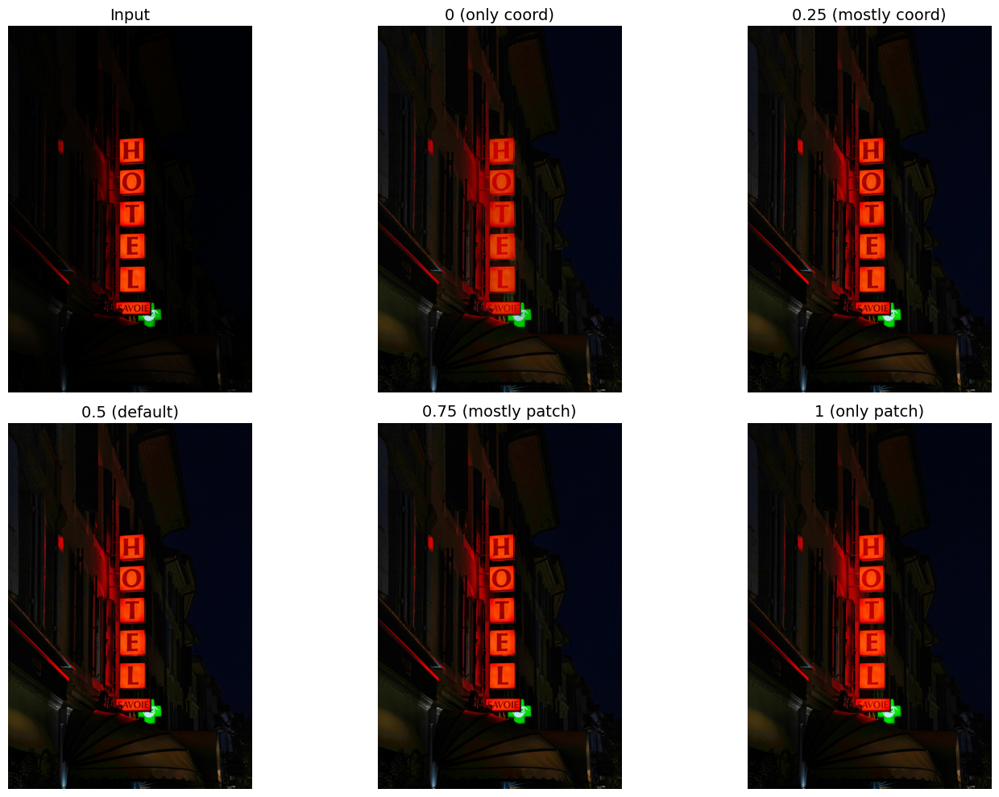

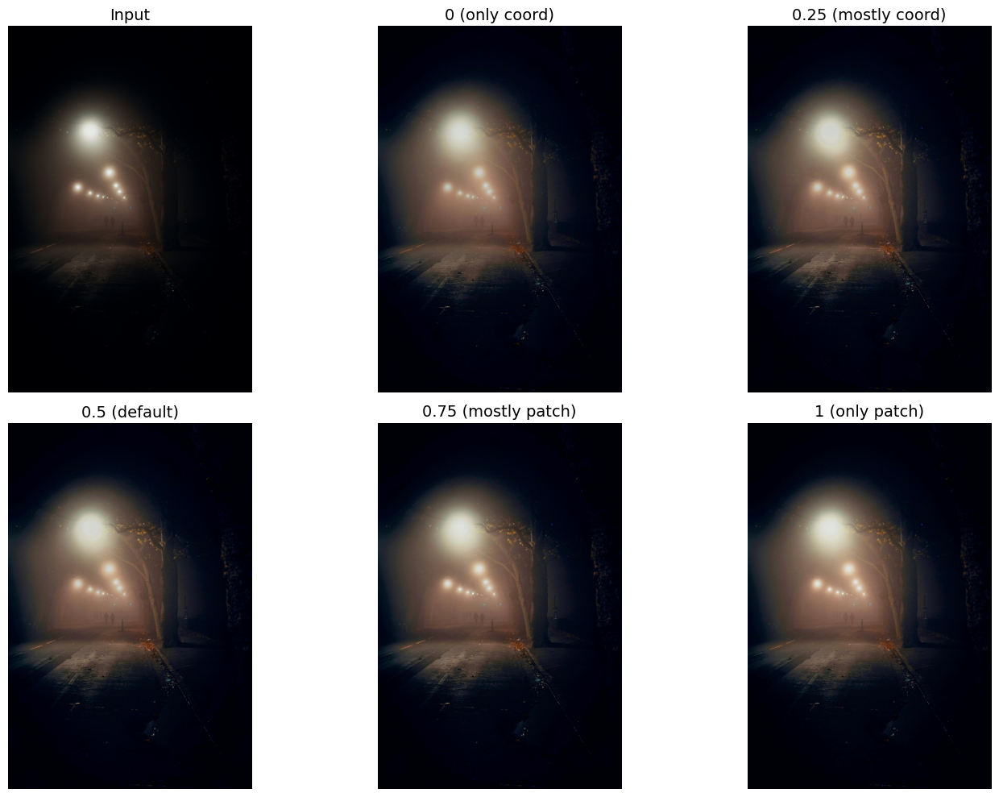

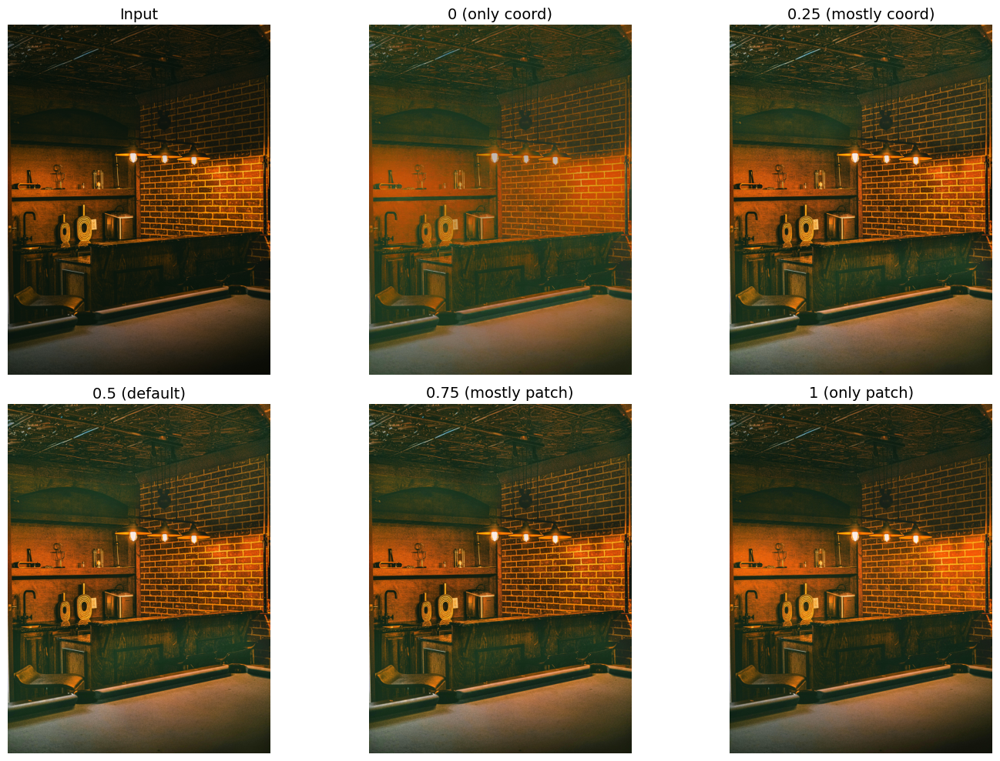

In [8]:
import matplotlib.pyplot as plt
from PIL import Image
import os

for filename in os.listdir('colie-experiments/input/'):
    input_image  = Image.open('colie-experiments/input/' + filename)
    output_0_image = Image.open('colie-experiments/output_split_0/' + filename)
    output_25_image = Image.open('colie-experiments/output_split_0.25/' + filename)
    output_50_image = Image.open('colie-experiments/output/' + filename)
    output_75_image = Image.open('colie-experiments/output_split_0.75/' + filename)
    output_100_image = Image.open('colie-experiments/output_split_1/' + filename)

    images = [input_image, output_0_image, output_25_image, output_50_image, output_75_image, output_100_image]

    labels = ['Input', '0 (only coord)', '0.25 (mostly coord)', '0.5 (default)', '0.75 (mostly patch)', '1 (only patch)']

    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    axes = axes.flatten()

    for i in range(6):
        axes[i].imshow(images[i])
        axes[i].set_title(labels[i], fontsize=14)
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()